Cột 'ma_ngoai_ngu' có dữ liệu không thể chuyển đổi sang số.
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 

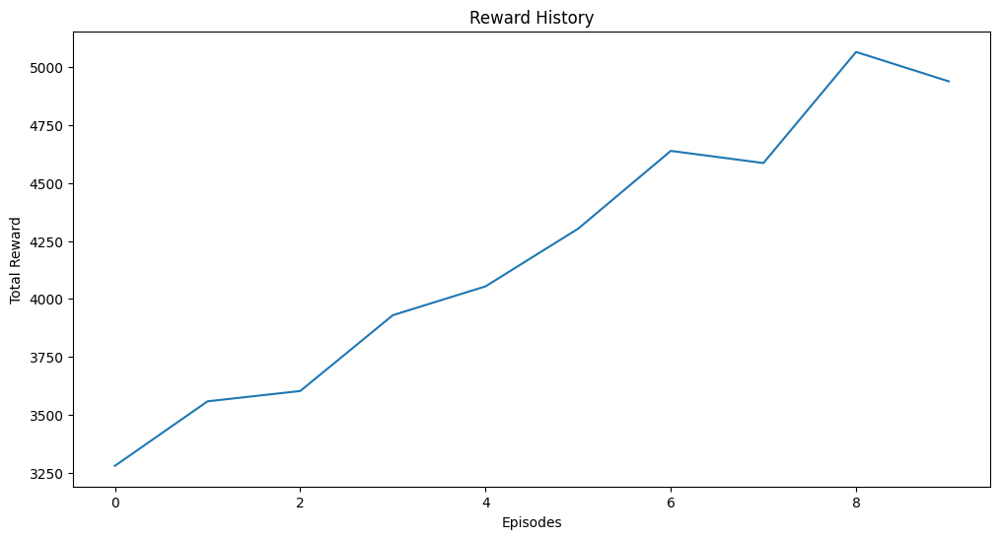

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step

Kết quả dự đoán:
Toán:3.2 Văn:4.2 Ngoại ngữ:3.5


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Input
from tensorflow.keras.optimizers import Adam
import random
from collections import deque
import matplotlib.pyplot as plt
import joblib

def preprocess_data(file_path):
    try:
        data = pd.read_csv(file_path)
    except FileNotFoundError:
        print(f"Lỗi: Không tìm thấy file tại đường dẫn: {file_path}")
        return None
    except Exception as e:
        print(f"Đã xảy ra lỗi trong quá trình đọc file: {e}")
        return None

    numerical_cols = data.select_dtypes(include=np.number).columns
    for col in numerical_cols:
        data.loc[:, col] = data[col].fillna(data[col].median())

    object_cols = data.select_dtypes(include=object).columns
    for col in object_cols:
        data.loc[:, col] = data[col].fillna(data[col].mode()[0])

    for col in data.columns:
        try:
            data.loc[:, col] = pd.to_numeric(data[col], errors='raise')
        except (ValueError, TypeError):
            print(f"Cột '{col}' có dữ liệu không thể chuyển đổi sang số.")

    numerical_cols = data.select_dtypes(include=np.number).columns
    selected_cols = ['Toan', 'NguVan', 'NgoaiNgu']
    cols_to_scale = [col for col in selected_cols if col in numerical_cols]
    
    scaler = MinMaxScaler()
    scaled_data = pd.DataFrame(scaler.fit_transform(data[cols_to_scale]), columns=cols_to_scale)
    data.loc[:, cols_to_scale] = scaled_data
    
    joblib.dump(scaler, 'scaler.pkl')
    
    input_data = data[cols_to_scale].values
    return input_data

def build_dqn_model(observation_space, action_space):
    model = Sequential([
        Input(shape=observation_space.shape),
        Dense(64, activation='relu'),
        Dense(64, activation='relu'),
        Dense(action_space.n * 3) 
    ])
    model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(learning_rate=0.001))
    return model

def train_dqn(env, model, target_model, episodes, epsilon, epsilon_min, epsilon_decay, batch_size, gamma, target_update_freq, replay_buffer_size):
    replay_buffer = deque(maxlen=replay_buffer_size)
    reward_history = []

    for episode in range(episodes):
        state = env.reset()
        done = False
        total_reward = 0

        while not done:
            if np.random.rand() <= epsilon:
                action = [
                    random.randrange(env.action_space.n),
                    random.randrange(env.action_space.n),
                    random.randrange(env.action_space.n)
                ]
            else:
                q_values = model.predict(np.array([state]))
                n_actions = env.action_space.n
                q_toan = q_values[0][:n_actions]
                q_van = q_values[0][n_actions:2*n_actions]
                q_ngoaingu = q_values[0][2*n_actions:]
                
                action = [
                    np.argmax(q_toan),
                    np.argmax(q_van),
                    np.argmax(q_ngoaingu)
                ]

            next_state, reward, done, _ = env.step(action)
            total_reward += reward

            action_array = np.array(action)
            
            replay_buffer.append((state, action_array, reward, next_state, done))
            state = next_state

            if len(replay_buffer) > batch_size:
                minibatch = random.sample(replay_buffer, batch_size)
                states, actions, rewards, next_states, dones = zip(*minibatch)

                states = np.array(states)
                actions = np.array(actions)
                rewards = np.array(rewards)
                next_states = np.array([ns if ns is not None else np.zeros(3) for ns in next_states])
                dones = np.array(dones)

                current_q_values = model.predict(states)
                next_q_values = target_model.predict(next_states)

                for i in range(batch_size):
                    for j in range(3): 
                        action_idx = actions[i][j]
                        q_idx = j * env.action_space.n + action_idx
                        if dones[i]:
                            current_q_values[i][q_idx] = rewards[i]
                        else:
                            next_q_start = j * env.action_space.n
                            next_q_end = (j + 1) * env.action_space.n
                            max_next_q = np.max(next_q_values[i][next_q_start:next_q_end])
                            current_q_values[i][q_idx] = rewards[i] + gamma * max_next_q

                model.train_on_batch(states, current_q_values)

        if episode % target_update_freq == 0:
            target_model.set_weights(model.get_weights())

        if epsilon > epsilon_min:
            epsilon *= epsilon_decay
            epsilon = max(epsilon_min, epsilon)

        reward_history.append(total_reward)

        print(f"Episode: {episode + 1}, Total Reward: {total_reward}, Epsilon: {epsilon}")

    return reward_history

class ExamPredictEnv:
    def __init__(self, data):
        self.data = data
        self.current_step = 0
        self.action_space = ActionSpace() 
        self.observation_space = ObservationSpace() 

    def reset(self):
        """Khởi tạo lại môi trường."""
        self.current_step = 0
        return self.data[self.current_step]

    def step(self, actions):
        """Thực hiện một hành động."""
        reward = self._calculate_reward(actions)
        self.current_step += 1
        done = self.current_step >= len(self.data) - 1
        next_state = self.data[self.current_step] if not done else None
        
        return next_state, reward, done, {}
    
    def _calculate_reward(self, actions):
        actual_scores = self.data[self.current_step + 1]
        predicted_scores = np.array([
            self._action_to_scores(actions[0]), 
            self._action_to_scores(actions[1]), 
            self._action_to_scores(actions[2])  
        ])
        
        errors = (actual_scores - predicted_scores) ** 2
        
        reward = 10.0 / (1.0 + np.mean(errors))
        
        return reward
    
    def _action_to_scores(self, action):
        base_score = float(action)
        
        adjusted_score = base_score
        
        if adjusted_score < 0:
            adjusted_score = 0
        elif adjusted_score > 10:
            adjusted_score = 10
            
        adjusted_score = round(adjusted_score, 2)
        
        return adjusted_score

def predict_exam(model, observation):
    observation = observation.reshape(-1, 3)
    q_values = model.predict(observation)
    
    
    n_actions = 11 
    q_toan = q_values[0][:n_actions]
    q_van = q_values[0][n_actions:2*n_actions]
    q_ngoaingu = q_values[0][2*n_actions:]
    
    temp_toan = 0.3     # Lower temperature for more confident predictions
    temp_van = 0.4      # Slightly higher for more variation
    temp_ngoaingu = 0.4 # Adjust based on subject characteristics
    
    normalize = lambda x: (x - np.min(x)) / (np.max(x) - np.min(x) + 1e-10)
    
    q_toan = normalize(q_toan) / temp_toan
    q_van = normalize(q_van) / temp_van
    q_ngoaingu = normalize(q_ngoaingu) / temp_ngoaingu
    
    def stable_softmax(x):
        exp_x = np.exp(x - np.max(x))
        return exp_x / (np.sum(exp_x) + 1e-10)
    
    p_toan = stable_softmax(q_toan)
    p_van = stable_softmax(q_van)
    p_ngoaingu = stable_softmax(q_ngoaingu)
    
    scores_range = np.arange(11)
    
    def weighted_prediction(probs, subject_type='general'):
        if subject_type == 'toan':
            bias = np.array([0.1, 0.2, 0.3, 0.5, 0.7, 1.0, 0.9, 0.7, 0.5, 0.3, 0.2])
        elif subject_type == 'van':
            bias = np.array([0.1, 0.2, 0.4, 0.6, 0.8, 1.0, 1.0, 0.8, 0.6, 0.4, 0.2])
        else:  
            bias = np.array([0.2, 0.3, 0.5, 0.7, 0.9, 1.0, 0.8, 0.6, 0.4, 0.3, 0.2])
            
        weighted_probs = probs * bias
        weighted_probs = weighted_probs / np.sum(weighted_probs)
        return np.clip(round(np.sum(weighted_probs * scores_range), 1), 0, 10)
    
    predicted_toan = weighted_prediction(p_toan, 'toan')
    predicted_van = weighted_prediction(p_van, 'van')
    predicted_ngoaingu = weighted_prediction(p_ngoaingu, 'ngoaingu')
    
    return predicted_toan, predicted_van, predicted_ngoaingu

class ActionSpace:
  """Lớp định nghĩa action space"""
  def __init__(self):
    self.n = 11 
  def sample(self):
    return random.randint(0, self.n-1)

class ObservationSpace:
  """Lớp định nghĩa observation space"""
  def __init__(self):
    self.shape = (3, ) 

file_path = 'diemthi2024.csv'
data = preprocess_data(file_path)

train_size = 5000
data_train = data[:train_size]

env = ExamPredictEnv(data_train)

input_shape = env.observation_space
output_shape = env.action_space
model = build_dqn_model(input_shape, output_shape)
target_model = build_dqn_model(input_shape, output_shape)

episodes = 10 #Suggest: 5000
batch_size = 64 #Suggest: 64
gamma = 0.99
replay_buffer_size = 10000 #Suggest: 50000
target_update_freq = 10 #Suggest: 100
epsilon = 1.0
epsilon_min = 0.01
epsilon_decay = 0.995


# For report
reward_history = train_dqn(env, model, target_model, episodes, epsilon, epsilon_min, epsilon_decay, batch_size, gamma, target_update_freq, replay_buffer_size)

# Save model
model.save('exam_model.keras')

# Vẽ reward history
plt.figure(figsize=(12, 6))
plt.plot(reward_history)
plt.xlabel("Episodes")
plt.ylabel("Total Reward")
plt.title("Reward History")
plt.show()

# Predict or Simulate the exam
diem_tb_toan = 6.45
diem_tb_van = 7.23
diem_tb_ngoaingu = 5.51

observation = pd.DataFrame([[diem_tb_toan, diem_tb_van, diem_tb_ngoaingu]], 
                         columns=['Toan', 'NguVan', 'NgoaiNgu'])

try:
    scaler = joblib.load('scaler.pkl')
    observation_scaled = scaler.transform(observation)

    predicted_toan, predicted_van, predicted_ngoaingu = predict_exam(model, observation_scaled)
    
    print("\nKết quả dự đoán:")
    print(f"Toán:{predicted_toan} Văn:{predicted_van} Ngoại ngữ:{predicted_ngoaingu}")

except FileNotFoundError:
    print("Không tìm thấy file scaler.pkl")
except Exception as e:
    print(f"Lỗi khi dự đoán: {e}")